## Exercise 8 - Object detection using Tensorflow hub modules
- Do this exercise if you had problems with Neuwo AI platform!
- Use [this](https://hantt.pages.labranet.jamk.fi/ttc2050-material/material/08-ai-image-classification/#tensorflow-example-bounding-box-demo-using-pre-taught-cnn) demo as a guide for this exercise
- <b style="color:red;">Important:</b> Ensure that you have <b style="color:brown;">tensorflow</b> and <b style="color:brown;">tensorflow-hub</b> packages installed before starting! In addition, <b style="color:brown;">tensorflow-estimator</b> package should use version 2.3.0!

In [1]:
!pip uninstall keras -y
!pip uninstall keras-nightly -y
!pip uninstall keras-Preprocessing -y
!pip uninstall keras-vis -y
!pip uninstall tensorflow -y

!pip install tensorflow==2.3.0
!pip install keras==2.4

# piti tehdä näin kun antoi muuten erroria

Found existing installation: Keras 2.4.0
Uninstalling Keras-2.4.0:
  Successfully uninstalled Keras-2.4.0
Found existing installation: Keras-Preprocessing 1.1.2
Uninstalling Keras-Preprocessing-1.1.2:
  Successfully uninstalled Keras-Preprocessing-1.1.2
Found existing installation: tensorflow 2.3.0
Uninstalling tensorflow-2.3.0:
  Successfully uninstalled tensorflow-2.3.0
  Using cached tensorflow-2.3.0-cp38-cp38-manylinux2010_x86_64.whl (320.5 MB)
  Using cached Keras_Preprocessing-1.1.2-py2.py3-none-any.whl (42 kB)
  Using cached Keras-2.4.0-py2.py3-none-any.whl (170 kB)


In [2]:
import tensorflow as tf

import tensorflow_hub as hub

import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

import time

In [3]:
#module = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
#detector = hub.load(module).signatures["default"]

module = "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1"
detector = hub.load(module).signatures["default"]

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [4]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [5]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [6]:
def draw_bounding_box_on_image(image, ymin, xmin, ymax, xmax, color, font, thickness=4, display_str_list=()):
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width, ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top), (left, top)], width=thickness, fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin), (left + text_width, text_bottom)], fill=color)
    draw.text((left + margin, text_bottom - text_height - margin), display_str, fill="black", font=font)
    text_bottom -= text_height - 2 * margin

In [7]:
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf", 25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"), int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(image_pil, ymin, xmin, ymax, xmax, color, font, display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

In [8]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [9]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

  print("Time for fetching the results from Tensorflow hub: ", end_time-start_time)

  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

In [10]:
def detect_img(image_url):
  start_time = time.time()
  image_path = download_and_resize_image(image_url, 640, 640)
  run_detector(detector, image_path)
  end_time = time.time()
  print("Total time including image processing:",end_time-start_time)

In [11]:
images = [
    "https://upload.wikimedia.org/wikipedia/commons/thumb/3/36/Hopetoun_falls.jpg/1280px-Hopetoun_falls.jpg",
    "https://upload.wikimedia.org/wikipedia/commons/b/b2/New_office.jpg"
]

Image downloaded to /tmp/tmp_03jvbqg.jpg.
Time for fetching the results from Tensorflow hub:  3.2883763313293457
Total time including image processing: 3.924999237060547
Image downloaded to /tmp/tmplfjbbr77.jpg.
Time for fetching the results from Tensorflow hub:  0.05241584777832031
Total time including image processing: 5.361520528793335


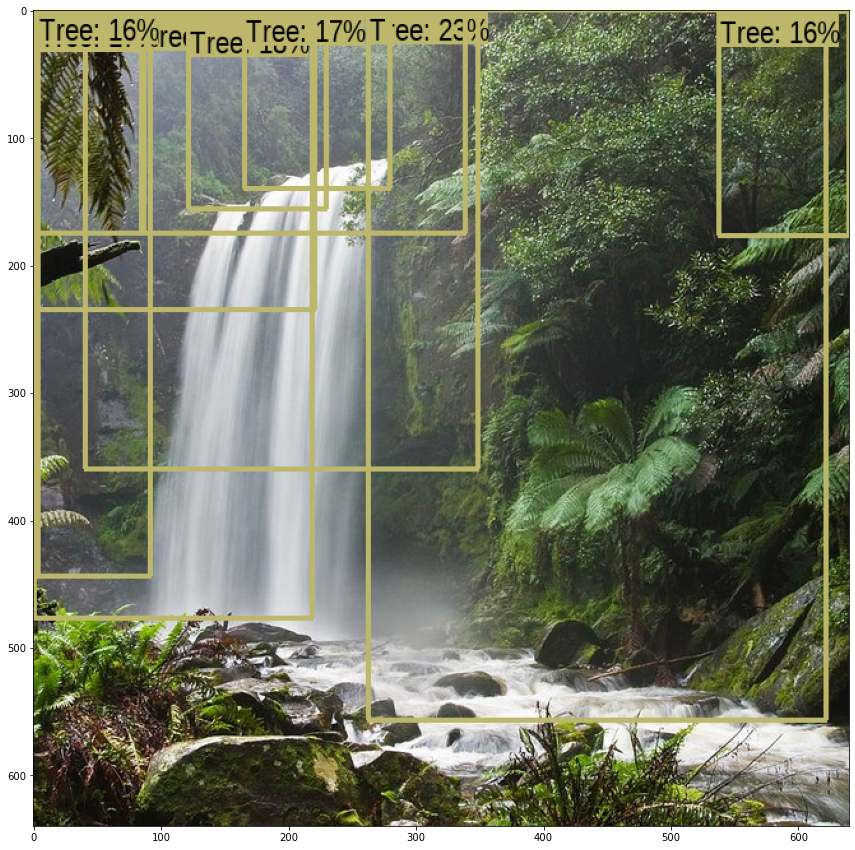

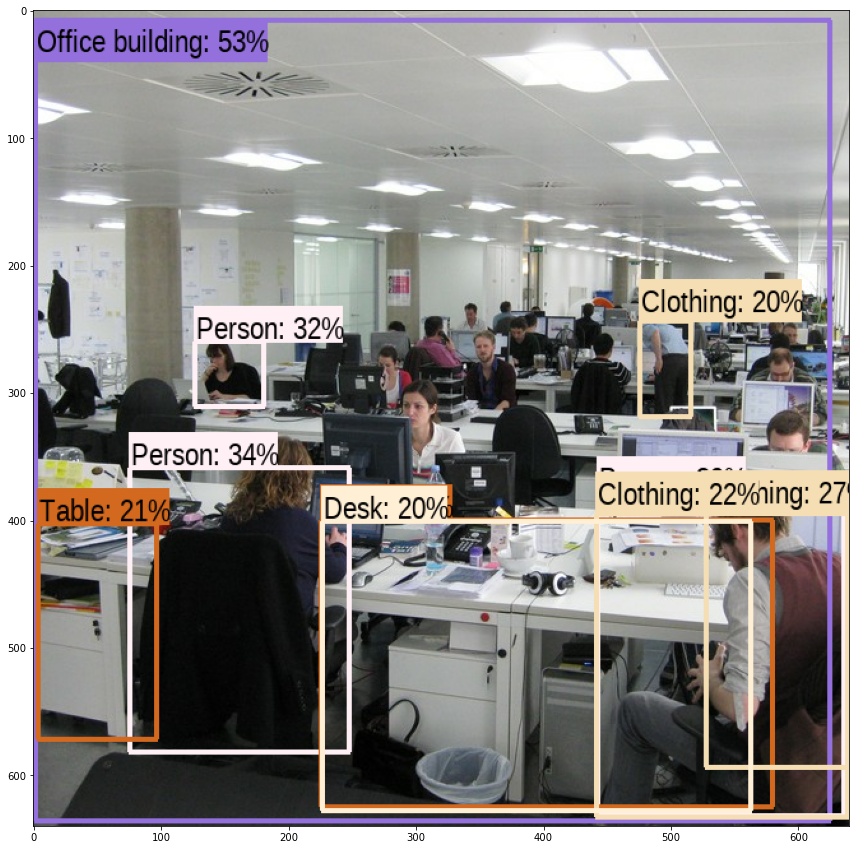

In [12]:
for url in images:
    detect_img(url)

1 Implement the code presented in the exercise mentioned above and verify it runs without problems. Paste one processed screenshot here as a result.

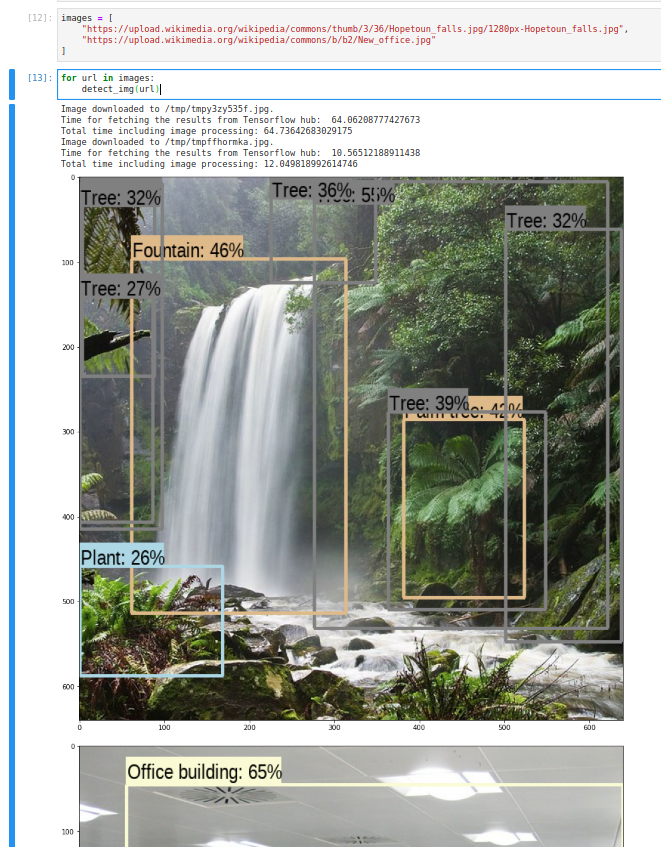

2 Choose five images of your choice with several objects in each. Remove two example images with your own images (urls). Rerun the notebook and verify that you have bounding boxes in each processed image. At this point, write down time values (fetch time from Tensorflow hub and overall time including the image processing).

In [13]:
my_images = [
    "https://static01.nyt.com/images/2020/11/20/nyregion/00nyvirus-numbers1/00nyvirus-numbers1-mediumSquareAt3X.jpg",
    "https://cdn11.bigcommerce.com/s-tu03jpzuky/images/stencil/980x980/products/1092/3095/indianSSbuffmultilifestyle2__75954.1614245938.jpg?c=2",
    "https://www.themayor.eu/web/files/articles/7877/main_image/thumb_1024x663_transport-in-helsinki.jpg",
    "https://www.txcumc.org/files/imagelibrary/bikes69011.jpg",
    "https://media.npr.org/assets/img/2018/12/23/gettyimages-459889074_wide-d0872ffb51c65d3d0bc82c25f3abdf6e8e294e0a.jpg"
]

Image downloaded to /tmp/tmpq6ilpqsf.jpg.
Time for fetching the results from Tensorflow hub:  0.051796674728393555
Total time including image processing: 0.9574453830718994
Image downloaded to /tmp/tmp5ol1oteq.jpg.
Time for fetching the results from Tensorflow hub:  0.05434012413024902
Total time including image processing: 0.4674355983734131
Image downloaded to /tmp/tmp2x9qws7j.jpg.
Time for fetching the results from Tensorflow hub:  0.05837059020996094
Total time including image processing: 2.081294059753418
Image downloaded to /tmp/tmpqdgexubh.jpg.
Time for fetching the results from Tensorflow hub:  0.05346941947937012
Total time including image processing: 3.8453032970428467
Image downloaded to /tmp/tmp1tm9vjx2.jpg.
Time for fetching the results from Tensorflow hub:  0.052640438079833984
Total time including image processing: 1.2525811195373535


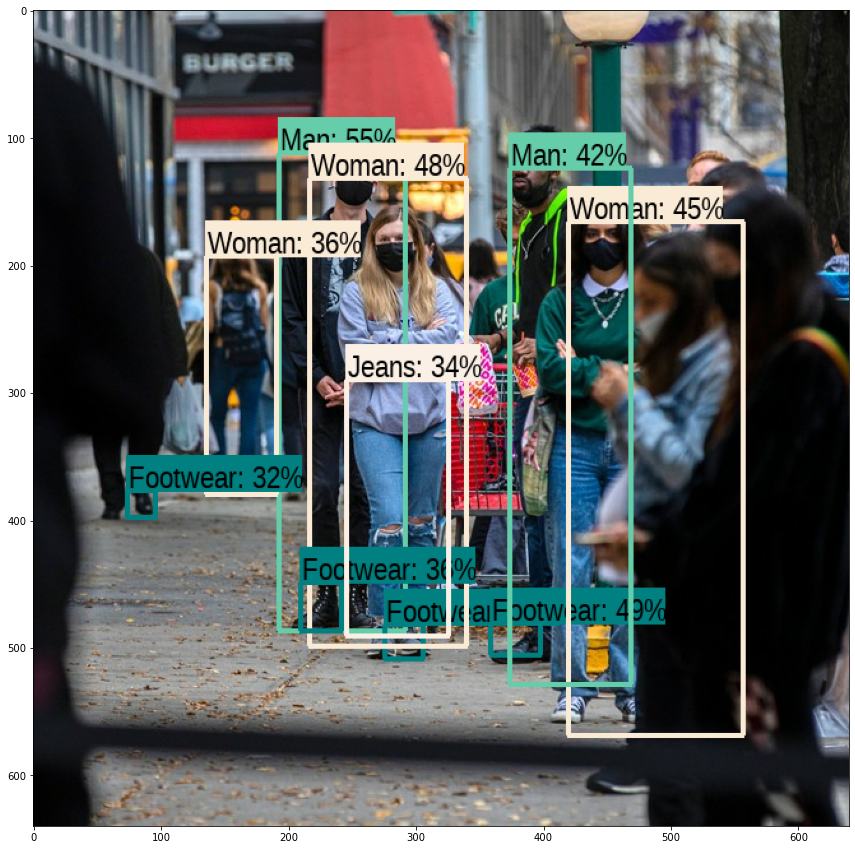

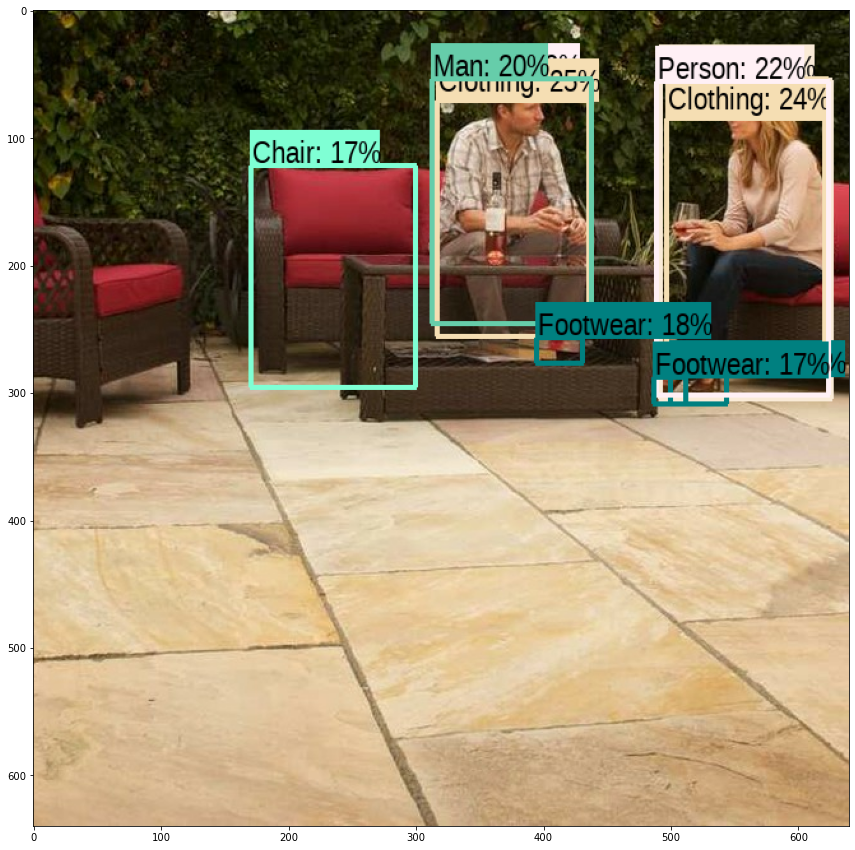

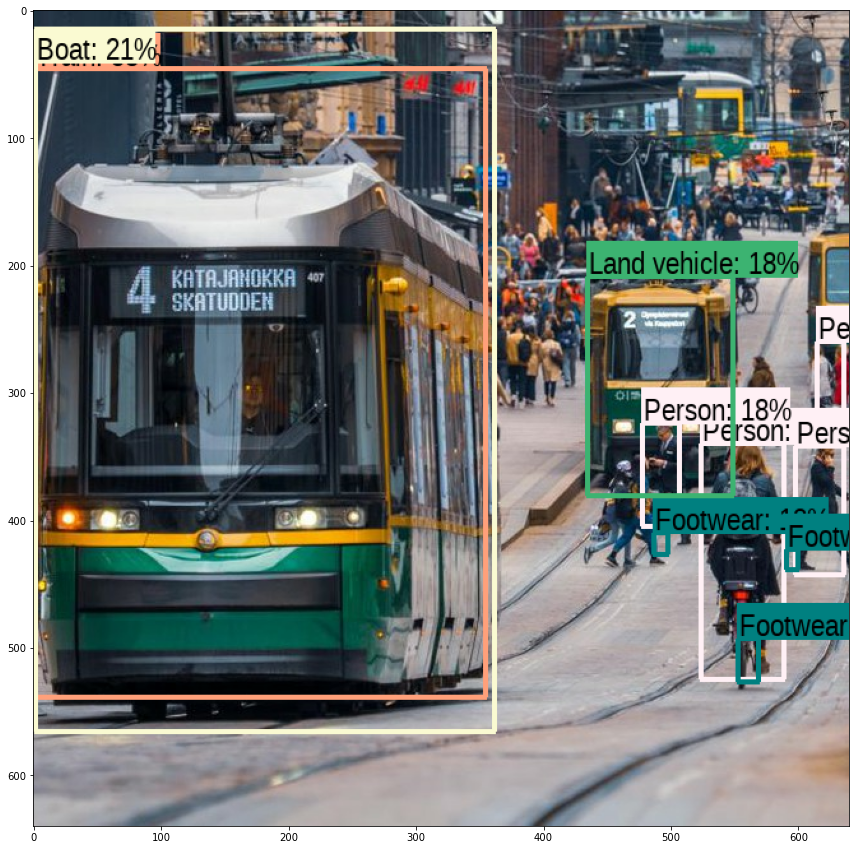

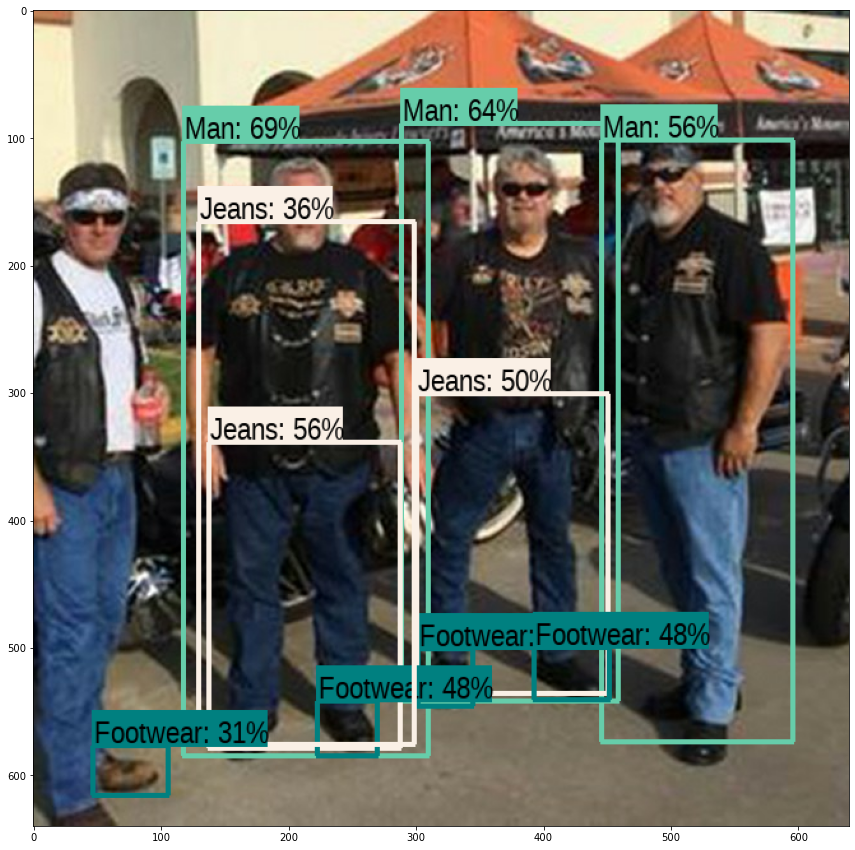

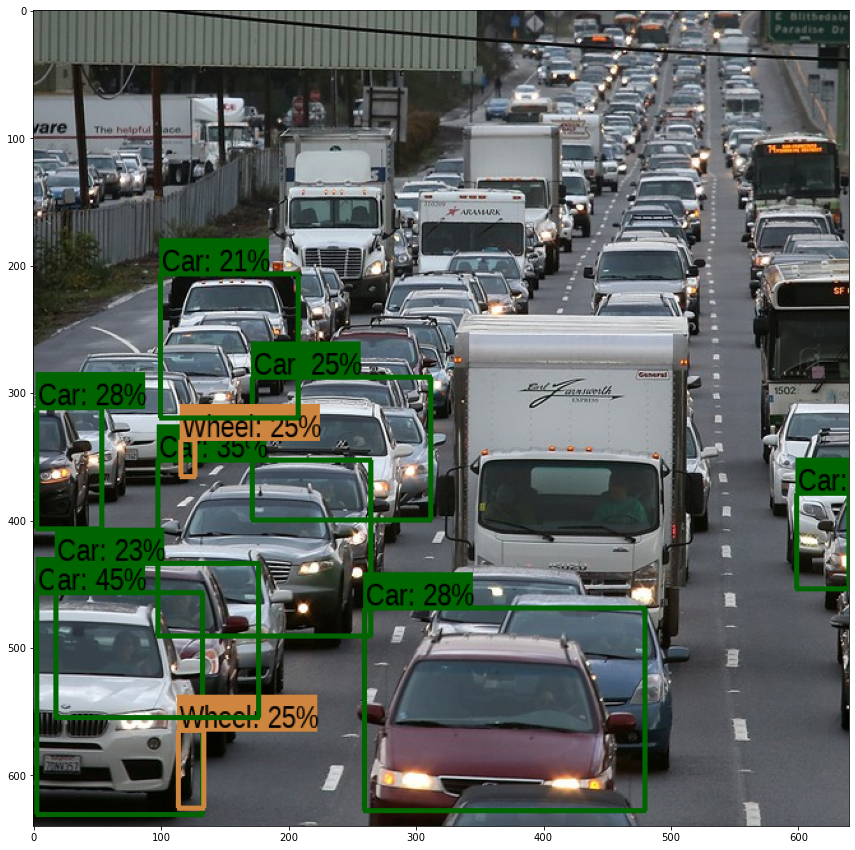

In [14]:
for url in my_images:
    detect_img(url)

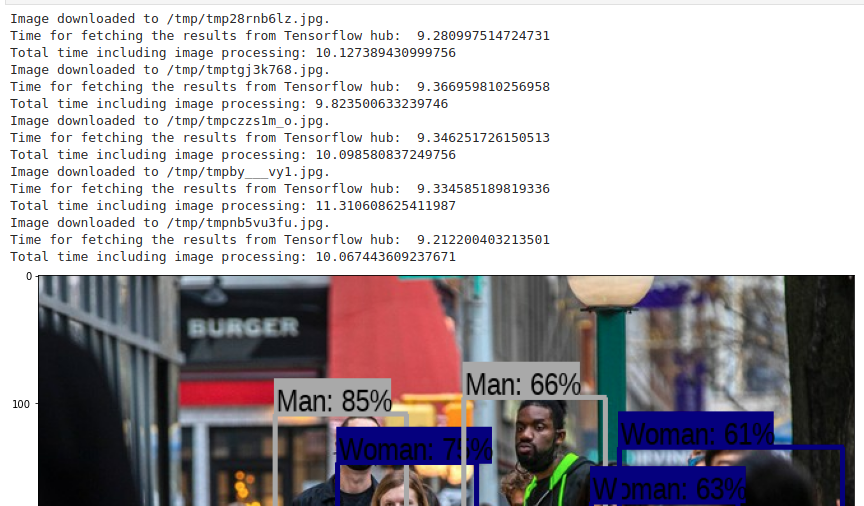

Bounding boxit kaikista löytyy

3 If you have successfully completed the first two tasks, you will now change the used object detection module and rerun the notebook. Go to the website [https://tfhub.dev](https://tfhub.dev). This website contains information of all modules that can be utilized with Tensorflow. Search for the MobileNet V2 module (SSD-based which uses Open Images V4). Use the module url mentioned in the documentation and rerun your notebook. Similar to previous task, write down the time values for further comparison.

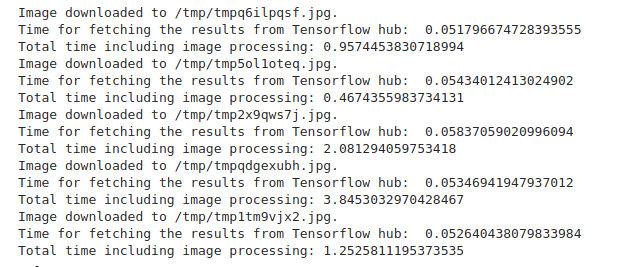

4 Comparing time values from two measurements, which one of the models performs faster? How much is the difference between two models?

Ensimmäinen oli hitaampi, mutta tarkempi. Mobilenet taas oli noin 4-5 kertaa nopeampi, mutta tulokset eivät olleet niin hyviä

5 Now compare the actual object detection results. How do these compare?

Kuten sanoin, niin MobileNet oli huonompi, mutta ei ollut niin huono etteikö sitä voisi käyttää. Suoriutui hyvin jostain kuvista MobileNet myös, mutta selvästi kuitenkin ensimmäinen oli parempi.